# インポート

In [1]:
import torchvision.models as models
from torchvision import datasets, transforms as T
import torch
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
!pip install git+https://github.com/nottombrown/imagenet_stubs
import imagenet_stubs
from imagenet_stubs.imagenet_2012_labels import label_to_name

  Cloning https://github.com/nottombrown/imagenet_stubs to /tmp/pip-req-build-toysdga7
  Running command git clone -q https://github.com/nottombrown/imagenet_stubs /tmp/pip-req-build-toysdga7
  Created wheel for imagenet-stubs: filename=imagenet_stubs-0.0.7-cp37-none-any.whl size=794840 sha256=150edb11cf3b22753d0ed123a3ac648c226d133cfa22216f3b0e4f7b249109b1
  Stored in directory: /tmp/pip-ephem-wheel-cache-zwwuginn/wheels/ae/51/e7/c1cfa8692ea864410aa778b169fc7766af073ac52a1bc23301
Successfully built imagenet-stubs


# 学習済みモデルの読み込み

In [2]:
model_vgg = models.vgg16(pretrained=True)
model_vgg

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

# 画像の読み込み+前処理

In [3]:
transform = T.Compose([T.Resize(256),
                       T.CenterCrop(224),
                       T.ToTensor(),
                       T.Normalize(mean=[0.485, 0.456, 0.406],
                                   std=[0.229, 0.224, 0.225]),])
def transform_image(img):
    print('入力画像')
    plt.imshow(img)
    plt.show()
    transformed = transform(img)
    img = transformed.to('cpu').detach().numpy().transpose(1, 2, 0).astype(np.uint8).copy()
    print('\n\n入力画像(前処理後)')
    plt.imshow(img)
    plt.show()
    
    return transformed

## 蛇の画像

入力画像


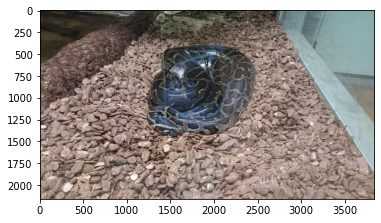



入力画像(前処理後)


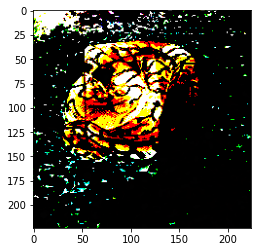

In [4]:
img_snake = Image.open('/content/drive/MyDrive/share/snake.JPG') # 

snake_transformed = transform_image(img_snake)

## ガンダムの画像

入力画像


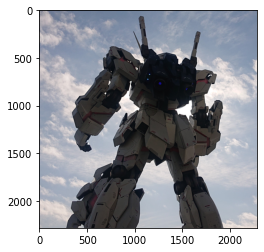



入力画像(前処理後)


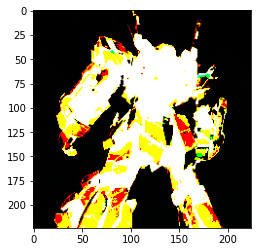

In [5]:
img_gundam = Image.open('/content/drive/MyDrive/share/gundam.jpg')
gundam_transformed = transform_image(img_gundam)

# クラス推定

In [6]:
dict_eval = {'snake': snake_transformed,
             'gundam': gundam_transformed}
model_vgg.eval()
for key, transformed in dict_eval.items():
    print('正解\n', key, sep='')
    outputs = model_vgg(transformed.view(1, 3, 224, 224))
    preds = torch.softmax(outputs, axis=1)
    labels = torch.argsort(outputs, descending=True)#.item()
    print('予測')
    for i in range(5):
        label = labels[0, i].item()
        print(f'ラベル：{label_to_name(label)}　\t\t 確率：{round(preds[0, label].item(), 4) * 100}\%')

正解
snake
予測
ラベル：rock python, rock snake, Python sebae　		 確率：92.4\%
ラベル：boa constrictor, Constrictor constrictor　		 確率：4.02\%
ラベル：night snake, Hypsiglena torquata　		 確率：1.54\%
ラベル：hognose snake, puff adder, sand viper　		 確率：1.15\%
ラベル：king snake, kingsnake　		 確率：0.52\%
正解
gundam
予測
ラベル：projectile, missile　		 確率：43.519999999999996\%
ラベル：assault rifle, assault gun　		 確率：11.24\%
ラベル：parachute, chute　		 確率：9.56\%
ラベル：tripod　		 確率：7.539999999999999\%
ラベル：rifle　		 確率：5.35\%


# 畳み込み層の可視化

In [7]:
conv_0 = np.array(model_vgg.state_dict()['features.0.weight'])
conv_10 = np.array(model_vgg.state_dict()['features.10.weight'])
conv_28 = np.array(model_vgg.state_dict()['features.28.weight'])

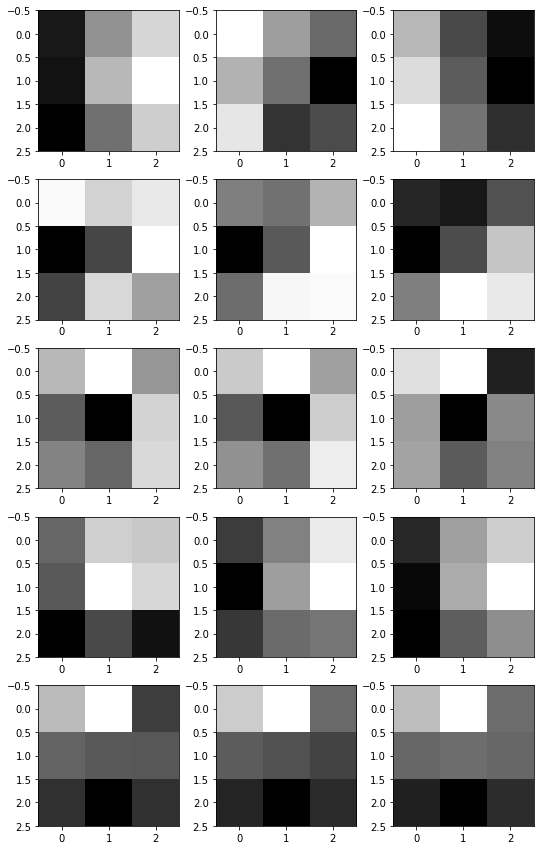

In [8]:
num_filter = 5
num_map = 3
fig, ax  = plt.subplots(num_filter, num_map, figsize=(num_map*3, num_filter*3))
for i, filter in enumerate(conv_0[:num_filter]):
    for j, f in enumerate(filter[:num_map]):
        ax[i][j].imshow(f.reshape(3,3), cmap='gray')
plt.show()

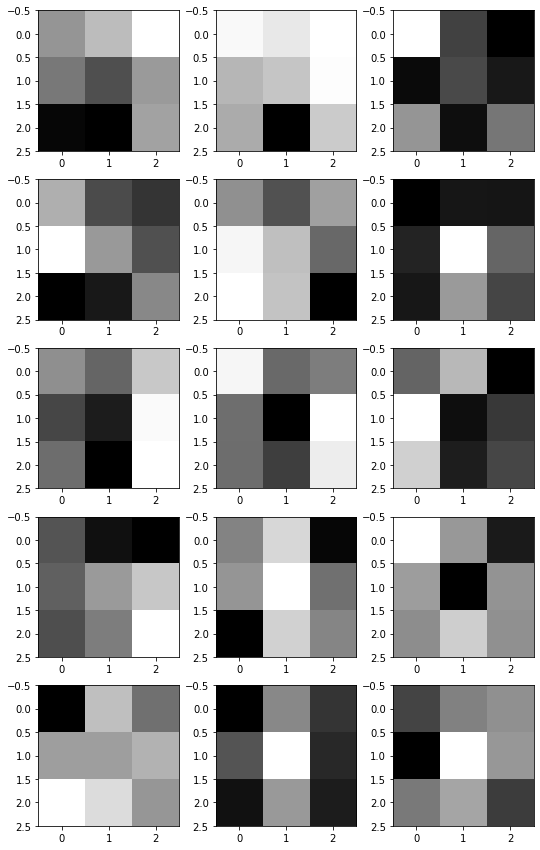

In [9]:
num_filter = 5
num_map = 3
fig, ax  = plt.subplots(num_filter, num_map, figsize=(num_map*3, num_filter*3))
for i, filter in enumerate(conv_10[:num_filter]):
    for j, f in enumerate(filter[:num_map]):
        ax[i][j].imshow(f.reshape(3,3), cmap='gray')
plt.show()

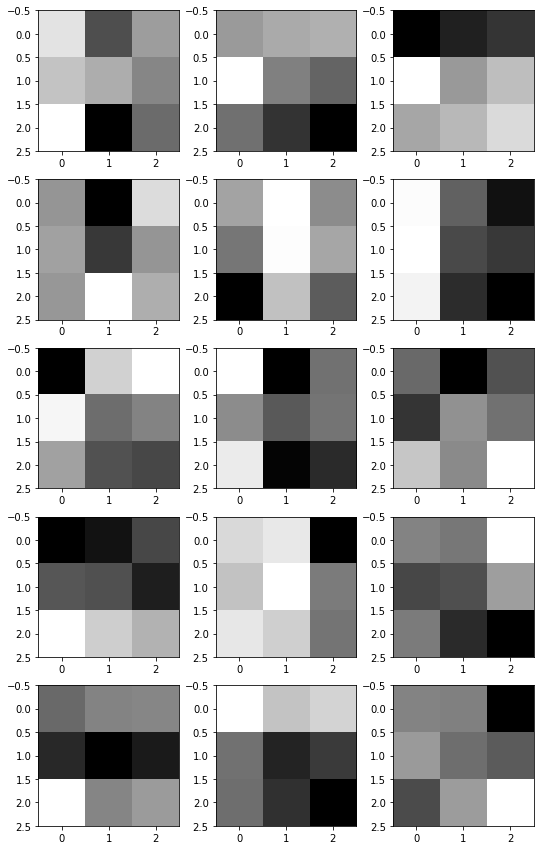

In [10]:
num_filter = 5
num_map = 3
fig, ax  = plt.subplots(num_filter, num_map, figsize=(num_map*3, num_filter*3))
for i, filter in enumerate(conv_28[:num_filter]):
    for j, f in enumerate(filter[:num_map]):
        ax[i][j].imshow(f.reshape(3,3), cmap='gray')
plt.show()

# 入力画像に対してモデルを適用していった結果

## 蛇の画像



第0層まで適用した画像


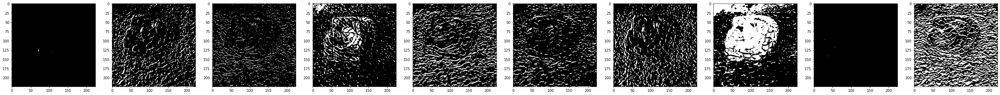



第1層まで適用した画像


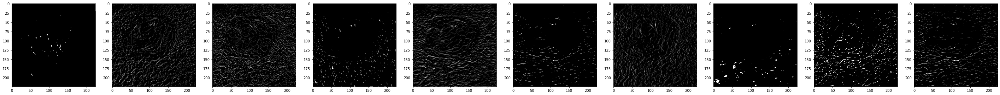



第2層まで適用した画像


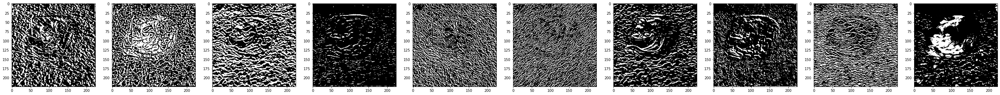



第3層まで適用した画像


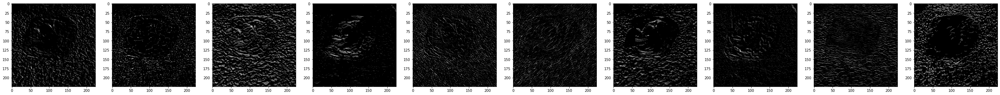



第4層まで適用した画像


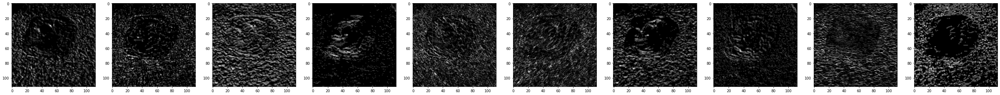



第5層まで適用した画像


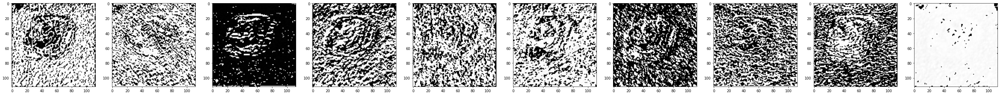



第6層まで適用した画像


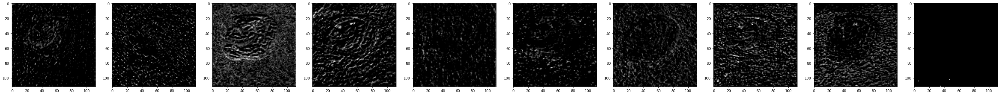



第7層まで適用した画像


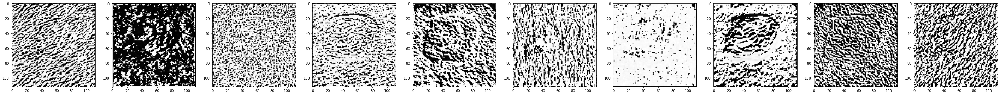



第8層まで適用した画像


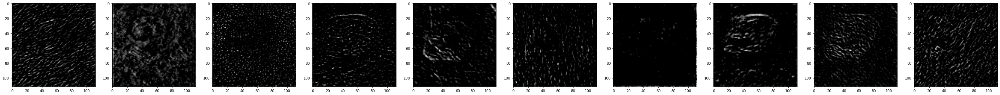



第9層まで適用した画像


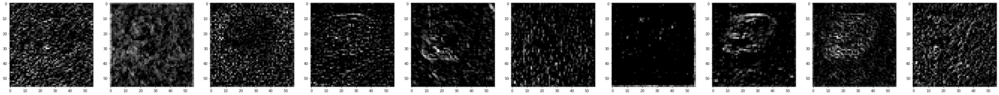



第10層まで適用した画像


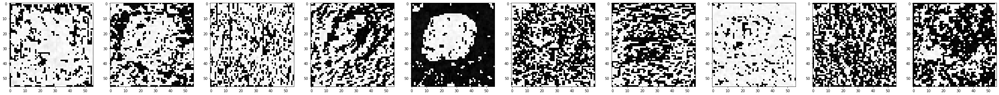



第11層まで適用した画像


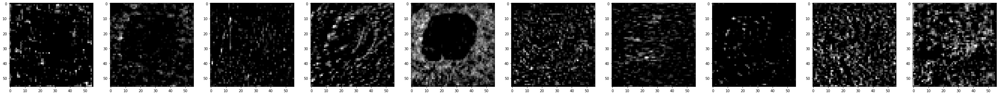



第12層まで適用した画像


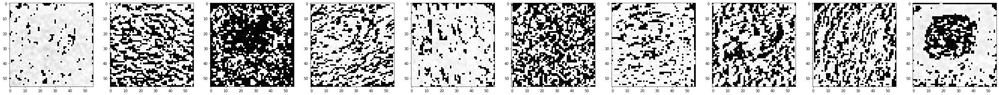



第13層まで適用した画像


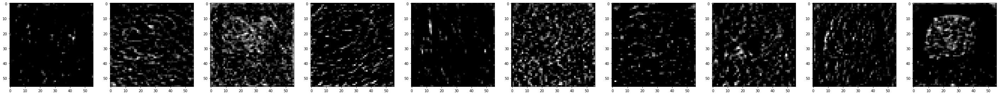



第14層まで適用した画像


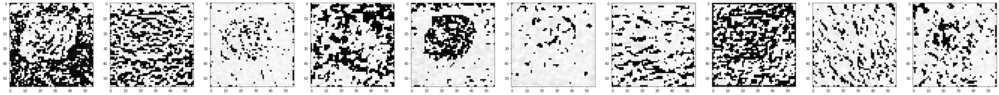



第15層まで適用した画像


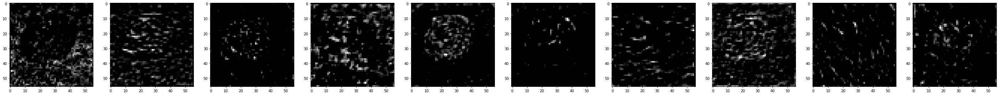



第16層まで適用した画像


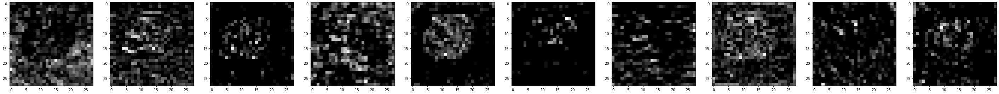



第17層まで適用した画像


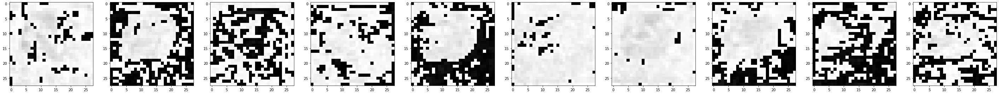



第18層まで適用した画像


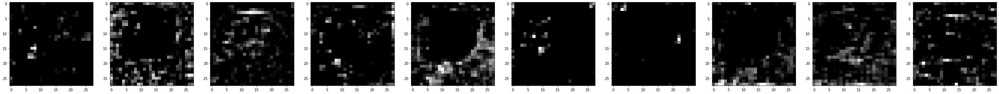



第19層まで適用した画像


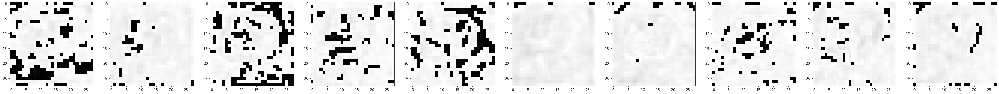



第20層まで適用した画像


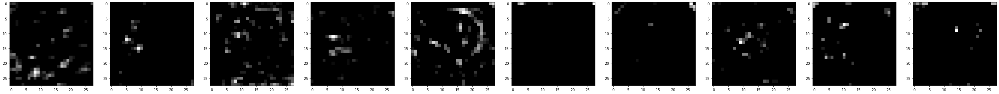



第21層まで適用した画像


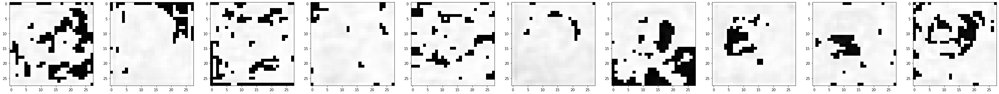



第22層まで適用した画像


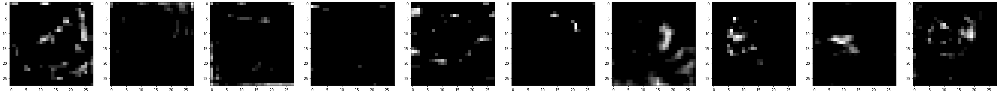



第23層まで適用した画像


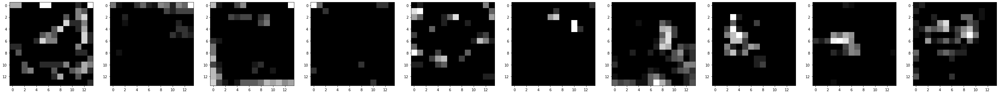



第24層まで適用した画像


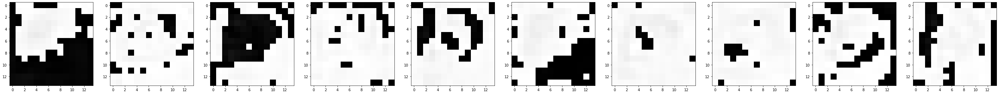



第25層まで適用した画像


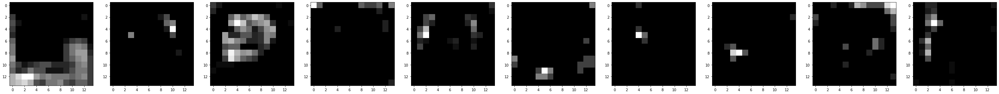



第26層まで適用した画像


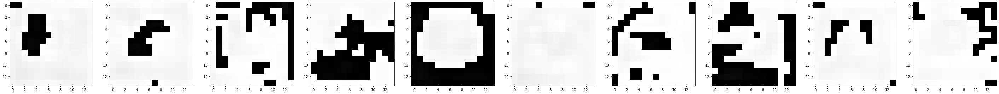



第27層まで適用した画像


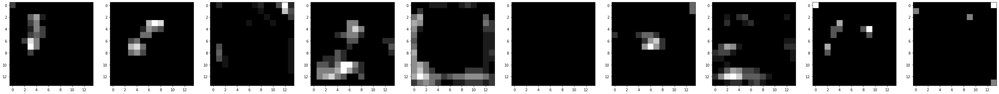



第28層まで適用した画像


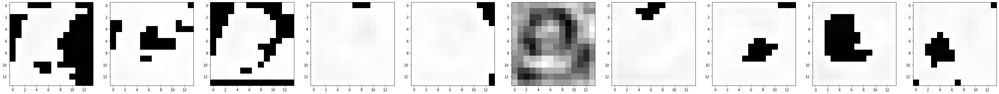



第29層まで適用した画像


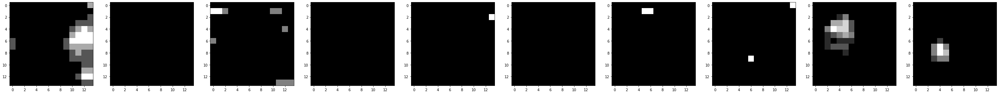



第30層まで適用した画像


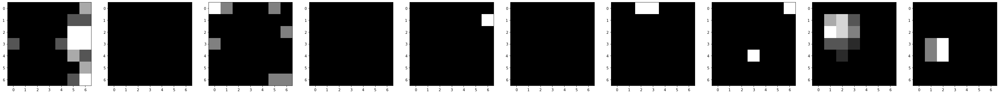

In [11]:
transformed = snake_transformed

num_image = 10


for num_layer in range(31):
    print(f'\n\n第{num_layer}層まで適用した画像')
    outputs = model_vgg.features[:num_layer+1](transformed.view(1, 3, 224, 224))
    fig, ax  = plt.subplots(1, num_image, figsize=(1*50, num_image*10))
    #fig, ax  = plt.subplots(1, num_image, figsize=(1*10, num_image*10))
    for i in range(num_image):
        img = outputs[0][i].to('cpu').detach().numpy().astype(np.uint8).copy()
        ax[i].imshow(img, cmap='gray')
    plt.show()


## ガンダムの画像



第0層まで適用した画像


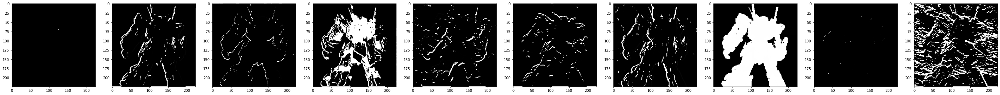



第1層まで適用した画像


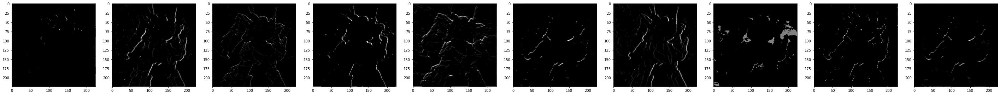



第2層まで適用した画像


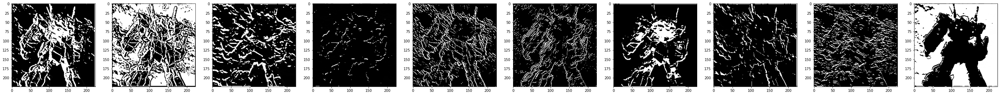



第3層まで適用した画像


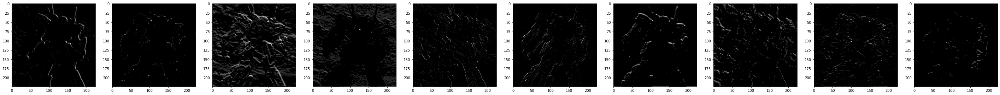



第4層まで適用した画像


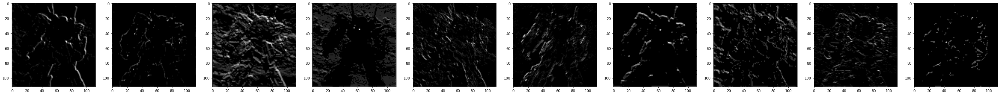



第5層まで適用した画像


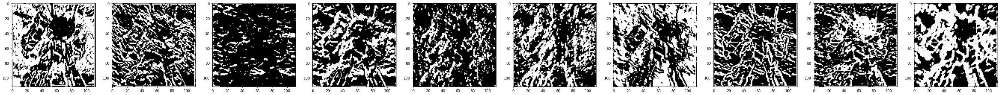



第6層まで適用した画像


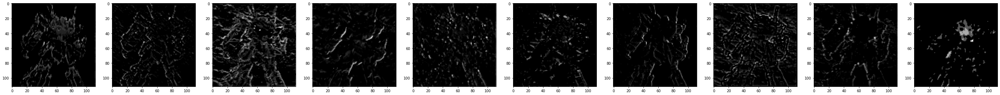



第7層まで適用した画像


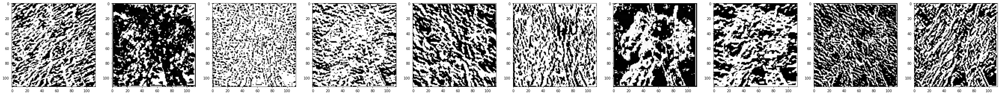



第8層まで適用した画像


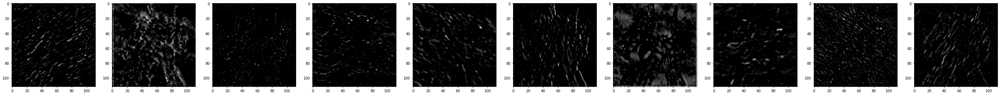



第9層まで適用した画像


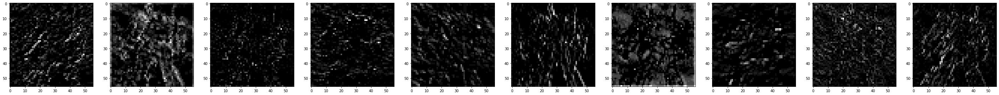



第10層まで適用した画像


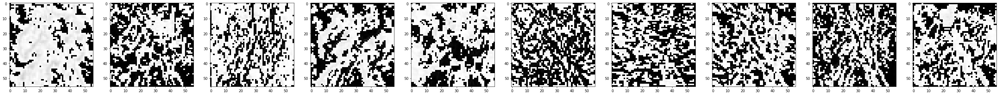



第11層まで適用した画像


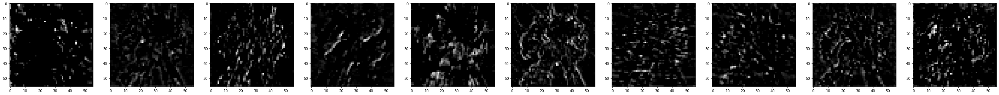



第12層まで適用した画像


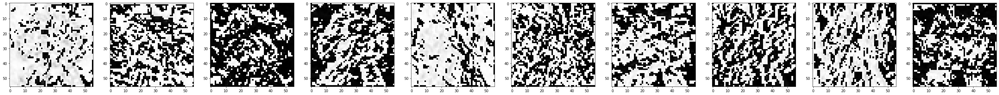



第13層まで適用した画像


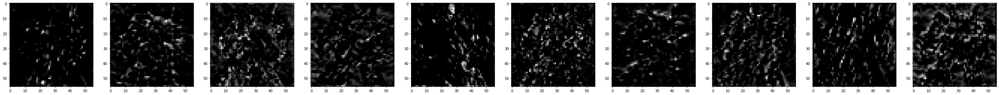



第14層まで適用した画像


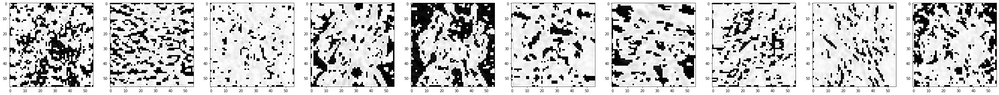



第15層まで適用した画像


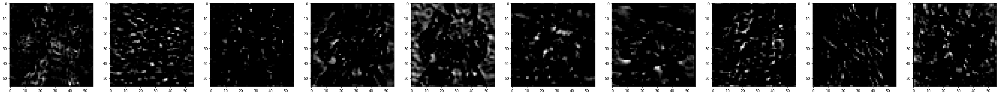



第16層まで適用した画像


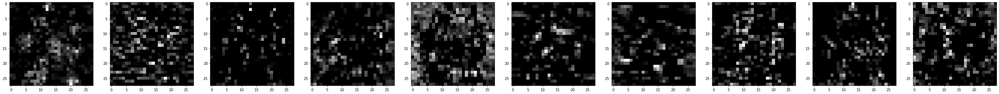



第17層まで適用した画像


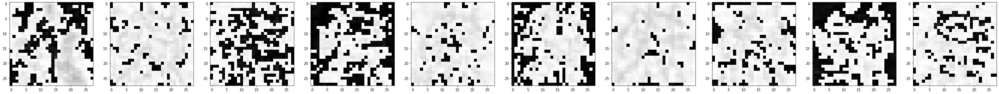



第18層まで適用した画像


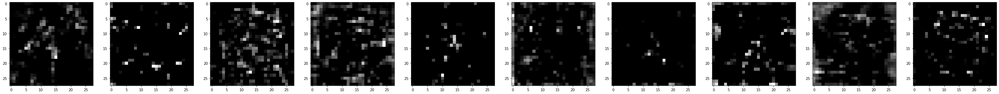



第19層まで適用した画像


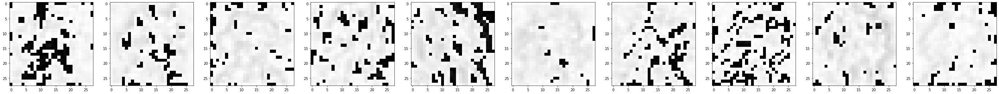



第20層まで適用した画像


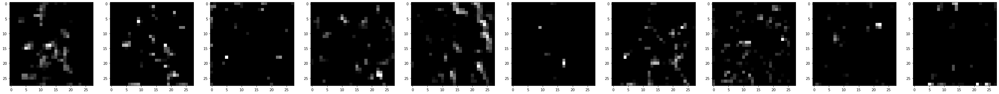



第21層まで適用した画像


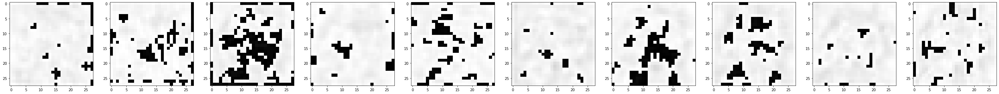



第22層まで適用した画像


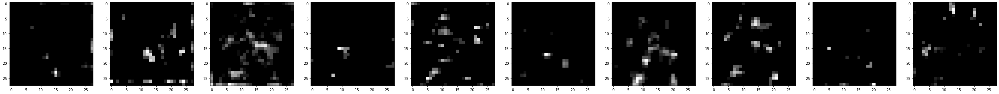



第23層まで適用した画像


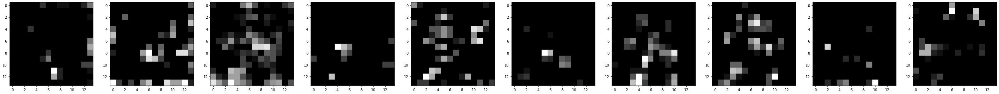



第24層まで適用した画像


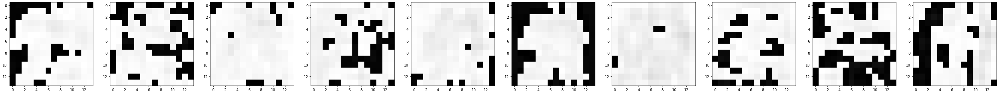



第25層まで適用した画像


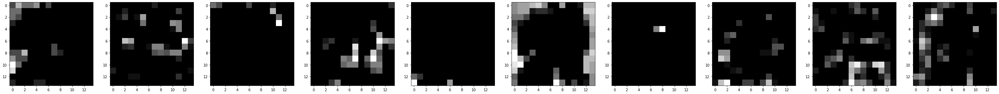



第26層まで適用した画像


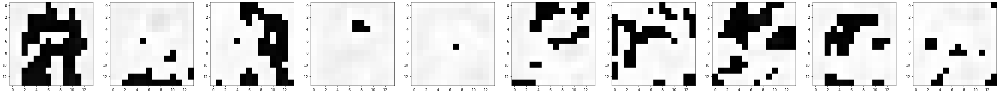



第27層まで適用した画像


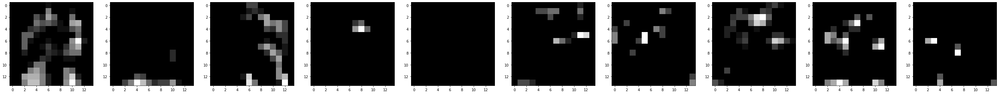



第28層まで適用した画像


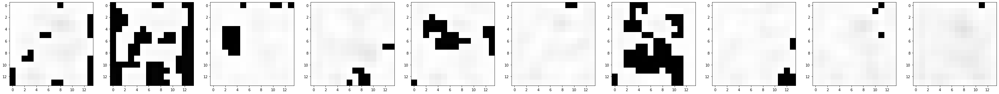



第29層まで適用した画像


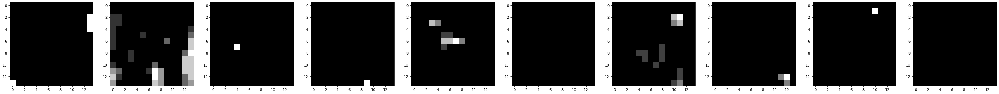



第30層まで適用した画像


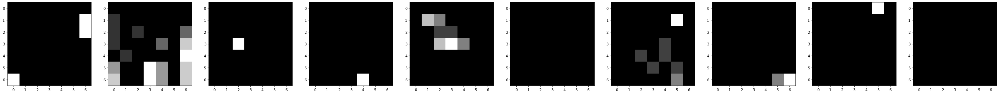

In [12]:
transformed = gundam_transformed

num_image = 10


for num_layer in range(31):
    print(f'\n\n第{num_layer}層まで適用した画像')
    outputs = model_vgg.features[:num_layer+1](transformed.view(1, 3, 224, 224))
    fig, ax  = plt.subplots(1, num_image, figsize=(1*50, num_image*10))
    for i in range(num_image):
        img = outputs[0][i].to('cpu').detach().numpy().astype(np.uint8).copy()
        ax[i].imshow(img, cmap='gray')
    plt.show()
